In [1]:

import pandas as pd                                                 # Importing for panel data analysis
from pandas_profiling import ProfileReport                          # Import Pandas Profiling (To generate Univariate Analysis) 
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high      
pd.set_option('display.max_colwidth', None)                         # Unfolding the max feature width for better clearity      
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
pd.set_option('display.float_format', lambda x: '%.5f' % x)         # To suppress scientific notation over exponential values

import numpy as np                                                  # Importing package numpys (For Numerical Python)

import matplotlib.pyplot as plt                                     # Importing pyplot interface using matplotlib
from matplotlib.pylab import rcParams                               # Backend used for rendering and GUI integration                                               
import seaborn as sns                                               # Importin seaborm library for interactive visualization
%matplotlib inline

from sklearn.metrics import accuracy_score                          # For calculating the accuracy for the model
from sklearn.metrics import precision_score                         # For calculating the Precision of the model
from sklearn.metrics import recall_score                            # For calculating the recall of the model
from sklearn.metrics import precision_recall_curve                  # For precision and recall metric estimation
from sklearn.metrics import confusion_matrix                        # For verifying model performance using confusion matrix
from sklearn.metrics import f1_score                                # For Checking the F1-Score of our model  
from sklearn.metrics import roc_curve                               # For Roc-Auc metric estimation

from sklearn.model_selection import train_test_split                # To split the data in training and testing part     
from sklearn.linear_model import LogisticRegression                 # To create the Logistic Regression Model

import warnings                                                     # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")                                   # Warnings will appear only once

In [2]:
!pip install -q datascience                   
!pip install -q pandas-profiling   
!pip install pandas-profiling --upgrade

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\jiten\\anaconda3\\Lib\\site-packages\\~=rkupsafe\\_speedups.cp38-win_amd64.pyd'
Consider using the `--user` option or check the permissions.

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
anaconda-project 0.9.1 requires ruamel-yaml, which is not installed.
sphinx 4.0.1 requires MarkupSafe<2.0, but you have markupsafe 2.0.1 which is incompatible.


In [3]:
import pandas_profiling

In [4]:
test_data=pd.read_csv("existing_base_test.csv")

In [5]:
profile = test_data.profile_report(title="Existing base test Data Preprocessing", progress_bar=False, minimal=True)
profile.to_file(output_file="Existing_test_data_profiling_before_preprocessing.html")

In [6]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2031 entries, 0 to 2030
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   REF_NO                           2031 non-null   int64  
 1   children                         2031 non-null   object 
 2   age_band                         2031 non-null   object 
 3   status                           2031 non-null   object 
 4   occupation                       2031 non-null   object 
 5   occupation_partner               2031 non-null   object 
 6   home_status                      2031 non-null   object 
 7   family_income                    2031 non-null   object 
 8   self_employed                    2031 non-null   object 
 9   self_employed_partner            2031 non-null   object 
 10  year_last_moved                  2031 non-null   int64  
 11  TVarea                           2031 non-null   object 
 12  post_code           

In [7]:
test_data.describe(include='all')

,REF_NO,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,TVarea,post_code,post_area,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,gender,region,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance
count,2031.00000,2031,2031,2031,2031,2031,2031,2031,2031,2031,2031.00000,2031,2031,2031,2031.00000,2031.00000,2031.00000,2031.00000,2031.00000,2031.00000,2031.00000,2031.00000,2031.00000,2031.00000,2031.00000,2031,2031,2031.00000,2031.00000,2031.00000,2031.00000
unique,NaN,5,13,5,9,9,5,13,2,2,NaN,14,2029,1146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,12,NaN,NaN,NaN,NaN
top,NaN,Zero,45-50,Partner,Professional,Unknown,Own Home,">=35,000",No,No,NaN,Central,IG9 5DZ,PR4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Female,South East,NaN,NaN,NaN,NaN
freq,NaN,1217,261,1585,500,452,1907,503,1893,1819,NaN,324,2,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1528,420,NaN,NaN,NaN,NaN
mean,5664.78090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970.37420,NaN,NaN,NaN,24.20441,47.75711,28.76066,69.93890,20.40547,33.07273,28.36670,44.80398,6.33137,4.74235,19.01923,NaN,NaN,38.21344,22.72357,33.82063,94.88772
std,3332.89296,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,170.45773,NaN,NaN,NaN,49.76050,76.00507,53.21927,94.60494,34.09486,46.42137,80.74497,61.74115,13.45680,10.12717,78.06662,NaN,NaN,41.41205,30.36411,37.52538,102.91554
min,1.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000,NaN,NaN,NaN,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,NaN,NaN,0.00000,0.00000,0.00000,-74.07000
25%,2816.50000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979.00000,NaN,NaN,NaN,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,NaN,NaN,8.19500,4.83000,8.83000,28.33000
50%,5575.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1988.00000,NaN,NaN,NaN,0.00000,19.47000,0.00000,34.49000,4.49000,17.97000,0.00000,23.98000,0.00000,0.00000,0.00000,NaN,NaN,25.59000,13.47000,22.56000,68.53000
75%,8572.50000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1994.00000,NaN,NaN,NaN,24.49000,69.71000,35.97000,100.68000,29.47000,48.95000,24.87500,63.93000,5.99000,4.99000,8.98500,NaN,NaN,54.21500,29.89500,46.21000,131.34500


In [8]:
train_data=pd.read_csv("existing_base_train.csv")

In [9]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 32 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   REF_NO                           8124 non-null   int64  
 1   children                         8124 non-null   object 
 2   age_band                         8124 non-null   object 
 3   status                           8124 non-null   object 
 4   occupation                       8124 non-null   object 
 5   occupation_partner               8124 non-null   object 
 6   home_status                      8124 non-null   object 
 7   family_income                    8124 non-null   object 
 8   self_employed                    8124 non-null   object 
 9   self_employed_partner            8124 non-null   object 
 10  year_last_moved                  8124 non-null   int64  
 11  TVarea                           8124 non-null   object 
 12  post_code           

In [10]:
train_data.describe(include='all')

,REF_NO,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,TVarea,post_code,post_area,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,gender,region,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance,Revenue_Grid
count,8124.00000,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124.00000,8124,8124,8124,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124,8124,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000
unique,NaN,5,13,5,9,9,5,13,2,2,NaN,14,8050,1937,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,13,NaN,NaN,NaN,NaN,NaN
top,NaN,Zero,45-50,Partner,Professional,Unknown,Own Home,">=35,000",No,No,NaN,Central,PR5 4DB,PR5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Female,South East,NaN,NaN,NaN,NaN,NaN
freq,NaN,4991,1098,6124,1949,1942,7506,2014,7543,7207,NaN,1294,2,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6106,1680,NaN,NaN,NaN,NaN,NaN
mean,5797.34330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1967.87691,NaN,NaN,NaN,23.25109,46.08292,27.28465,65.31794,18.82620,31.83802,25.41583,41.72363,6.05725,4.41691,19.19866,NaN,NaN,36.15275,21.44248,31.53065,89.35337,1.89414
std,3322.49757,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,182.56379,NaN,NaN,NaN,51.14750,79.08469,54.13354,95.76245,32.02233,45.24944,85.13015,64.41602,12.67337,9.94575,92.34313,NaN,NaN,42.47495,32.26166,39.48066,108.30354,0.30768
min,2.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000,NaN,NaN,NaN,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,NaN,NaN,0.00000,0.00000,0.00000,-78.43000,1.00000
25%,2924.75000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1978.00000,NaN,NaN,NaN,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,NaN,NaN,8.28250,4.66000,8.74000,26.27750,2.00000
50%,5811.50000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1988.00000,NaN,NaN,NaN,0.00000,17.48500,0.00000,31.47500,0.01000,14.98000,0.00000,23.48000,0.00000,0.00000,0.00000,NaN,NaN,23.59000,12.82000,21.14000,65.56000,2.00000
75%,8681.50000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1994.00000,NaN,NaN,NaN,23.48000,64.99000,34.49000,92.88750,26.97000,45.92250,20.82750,59.44000,5.49000,4.49000,7.48000,NaN,NaN,49.79500,27.97250,42.39250,123.97000,2.00000


In [11]:
profile1 = train_data.profile_report(title="Existing base train Data Preprocessing", progress_bar=False, minimal=True)
profile1.to_file(output_file="Existing_train_data_profiling_before_preprocessing.html")

In [12]:
train_data['children'].value_counts()

Zero    4991
1       1474
2       1271
3        375
4+        13
Name: children, dtype: int64

In [13]:
train_data['occupation'].value_counts()

Professional         1949
Retired              1799
Secretarial/Admin    1435
Housewife             984
Business Manager      578
Manual Worker         451
Unknown               449
Other                 432
Student                47
Name: occupation, dtype: int64

In [14]:
train_data['home_status'].value_counts()

Own Home                7506
Rent from Council/HA     279
Rent Privately           205
Live in Parental Hom      90
Unclassified              44
Name: home_status, dtype: int64

In [15]:
train_data['family_income'].value_counts()

>=35,000             2014
<27,500, >=25,000     969
<30,000, >=27,500     796
<25,000, >=22,500     656
<12,500, >=10,000     535
<20,000, >=17,500     525
<17,500, >=15,000     521
<15,000, >=12,500     508
<22,500, >=20,000     479
<10,000, >= 8,000     452
< 8,000, >= 4,000     328
< 4,000               233
Unknown               108
Name: family_income, dtype: int64

In [16]:
train_data['TVarea'].value_counts()

Central          1294
Carlton          1237
Meridian          977
Yorkshire         847
Granada           824
HTV               683
Anglia            597
Tyne Tees         433
Scottish TV       406
TV South West     286
Grampian          175
Unknown           154
Ulster            135
Border             76
Name: TVarea, dtype: int64

In [17]:
train_data['region'].value_counts()

South East          1680
North West          1517
Unknown              866
South West           769
West Midlands        658
East Midlands        623
Scotland             615
North                460
Wales                437
East Anglia          344
Northern Ireland     135
Isle of Man           15
Channel Islands        5
Name: region, dtype: int64

In [18]:
train_data = pd.get_dummies(train_data, columns=['children','age_band', 'status','occupation', 'occupation_partner','home_status','family_income','self_employed', 'self_employed_partner','TVarea','gender','region'], drop_first=True)

In [19]:
test_data = pd.get_dummies(test_data, columns=['children','age_band', 'status','occupation', 'occupation_partner','home_status','family_income','self_employed', 'self_employed_partner','TVarea','gender','region'], drop_first=True)

In [20]:
train_data.drop(['REF_NO', 'year_last_moved', 'post_code', 'post_area'], axis = 1,inplace = True)

In [21]:
test_data.drop(['REF_NO', 'year_last_moved', 'post_code', 'post_area'], axis = 1,inplace = True)

Text(0.5, 1.0, 'Correlation between features')

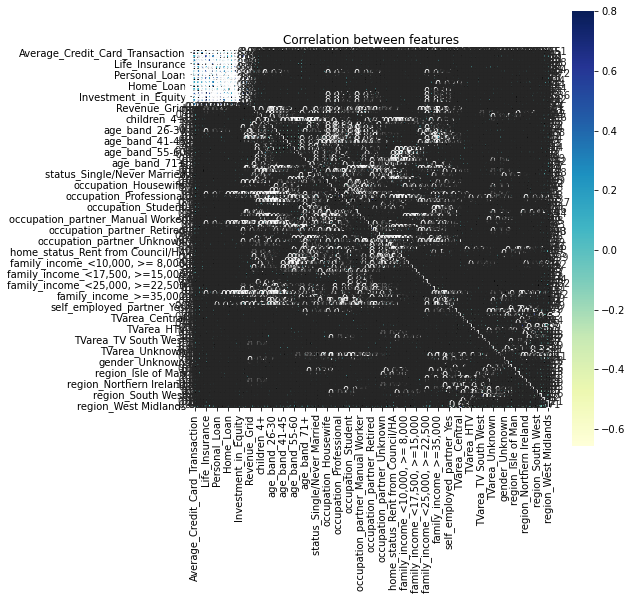

In [22]:
corr = train_data.corr()
plt.figure(figsize=(8,8))
sns.heatmap(corr,vmax=.8,linewidth=.01,square = True,annot = True, cmap='YlGnBu',linecolor ='black')
plt.title('Correlation between features')

In [23]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 97 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Average_Credit_Card_Transaction       8124 non-null   float64
 1   Balance_Transfer                      8124 non-null   float64
 2   Term_Deposit                          8124 non-null   float64
 3   Life_Insurance                        8124 non-null   float64
 4   Medical_Insurance                     8124 non-null   float64
 5   Average_A/C_Balance                   8124 non-null   float64
 6   Personal_Loan                         8124 non-null   float64
 7   Investment_in_Mutual_Fund             8124 non-null   float64
 8   Investment_Tax_Saving_Bond            8124 non-null   float64
 9   Home_Loan                             8124 non-null   float64
 10  Online_Purchase_Amount                8124 non-null   float64
 11  Investment_in_Com

In [24]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2031 entries, 0 to 2030
Data columns (total 95 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Average_Credit_Card_Transaction       2031 non-null   float64
 1   Balance_Transfer                      2031 non-null   float64
 2   Term_Deposit                          2031 non-null   float64
 3   Life_Insurance                        2031 non-null   float64
 4   Medical_Insurance                     2031 non-null   float64
 5   Average_A/C_Balance                   2031 non-null   float64
 6   Personal_Loan                         2031 non-null   float64
 7   Investment_in_Mutual_Fund             2031 non-null   float64
 8   Investment_Tax_Saving_Bond            2031 non-null   float64
 9   Home_Loan                             2031 non-null   float64
 10  Online_Purchase_Amount                2031 non-null   float64
 11  Investment_in_Com

In [25]:
test_data ["region_East Anglia"]=0

In [26]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2031 entries, 0 to 2030
Data columns (total 96 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Average_Credit_Card_Transaction       2031 non-null   float64
 1   Balance_Transfer                      2031 non-null   float64
 2   Term_Deposit                          2031 non-null   float64
 3   Life_Insurance                        2031 non-null   float64
 4   Medical_Insurance                     2031 non-null   float64
 5   Average_A/C_Balance                   2031 non-null   float64
 6   Personal_Loan                         2031 non-null   float64
 7   Investment_in_Mutual_Fund             2031 non-null   float64
 8   Investment_Tax_Saving_Bond            2031 non-null   float64
 9   Home_Loan                             2031 non-null   float64
 10  Online_Purchase_Amount                2031 non-null   float64
 11  Investment_in_Com

In [28]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 97 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Average_Credit_Card_Transaction       8124 non-null   float64
 1   Balance_Transfer                      8124 non-null   float64
 2   Term_Deposit                          8124 non-null   float64
 3   Life_Insurance                        8124 non-null   float64
 4   Medical_Insurance                     8124 non-null   float64
 5   Average_A/C_Balance                   8124 non-null   float64
 6   Personal_Loan                         8124 non-null   float64
 7   Investment_in_Mutual_Fund             8124 non-null   float64
 8   Investment_Tax_Saving_Bond            8124 non-null   float64
 9   Home_Loan                             8124 non-null   float64
 10  Online_Purchase_Amount                8124 non-null   float64
 11  Investment_in_Com

In [31]:
train_data1= train_data.sample(n = 2031)
train_data1

,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance,Revenue_Grid,children_2,children_3,children_4+,children_Zero,age_band_22-25,age_band_26-30,age_band_31-35,age_band_36-40,age_band_41-45,age_band_45-50,age_band_51-55,age_band_55-60,age_band_61-65,age_band_65-70,age_band_71+,age_band_Unknown,status_Partner,status_Single/Never Married,status_Unknown,status_Widowed,occupation_Housewife,occupation_Manual Worker,occupation_Other,occupation_Professional,occupation_Retired,occupation_Secretarial/Admin,occupation_Student,occupation_Unknown,occupation_partner_Housewife,occupation_partner_Manual Worker,occupation_partner_Other,occupation_partner_Professional,occupation_partner_Retired,occupation_partner_Secretarial/Admin,occupation_partner_Student,occupation_partner_Unknown,home_status_Own Home,home_status_Rent Privately,home_status_Rent from Council/HA,home_status_Unclassified,"family_income_< 8,000, >= 4,000","family_income_<10,000, >= 8,000","family_income_<12,500, >=10,000","family_income_<15,000, >=12,500","family_income_<17,500, >=15,000","family_income_<20,000, >=17,500","family_income_<22,500, >=20,000","family_income_<25,000, >=22,500","family_income_<27,500, >=25,000","family_income_<30,000, >=27,500","family_income_>=35,000",family_income_Unknown,self_employed_Yes,self_employed_partner_Yes,TVarea_Border,TVarea_Carlton,TVarea_Central,TVarea_Grampian,TVarea_Granada,TVarea_HTV,TVarea_Meridian,TVarea_Scottish TV,TVarea_TV South West,TVarea_Tyne Tees,TVarea_Ulster,TVarea_Unknown,TVarea_Yorkshire,gender_Male,gender_Unknown,region_East Anglia,region_East Midlands,region_Isle of Man,region_North,region_North West,region_Northern Ireland,region_Scotland,region_South East,region_South West,region_Unknown,region_Wales,region_West Midlands
2084,0.00000,94.45000,0.00000,17.99000,0.00000,104.95000,130.36000,51.97000,1.00000,0.00000,0.00000,22.49000,48.05000,51.05000,155.28000,2,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
833,0.00000,108.46000,0.00000,58.99000,0.00000,0.00000,0.00000,13.99000,0.00000,16.98000,0.00000,33.49000,5.16000,12.16000,93.31000,2,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
96,0.00000,0.00000,0.00000,0.00000,0.00000,13.48000,69.44000,0.00000,1.99000,3.49000,7.98000,0.00000,16.06000,14.15000,21.87000,2,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4010,100.97000,44.99000,69.98000,192.42000,40.94000,8.48000,20.48000,107.93000,5.48000,0.00000,0.00000,89.86000,23.73000,62.62000,187.12000,2,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3060,0.00000,0.00000,34.99000,69.98000,0.00000,0.00000,0.00000,28.00000,0.00000,0.00000,0.00000,20.99000,4.67000,16.33000,27.25000,2,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0
381,24.93000,64.97000,52.99000,237.32000,0.00000,143.94000,20.46000,33.47000,19.43000,0.00000,35.97000,76.04000,42.21000,75.77000,196.84000,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7258,79.47000,0.00000,184.44000,0.00000,62.96000,19.98000,0.00000,0.00000,0.00000,0.00000,0.00000,65.37000,3.33000,13.82000,105.37000,2,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,

In [89]:
train_data.corr(method ='pearson')

,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance,Revenue_Grid,children_2,children_3,children_4+,children_Zero,age_band_22-25,age_band_26-30,age_band_31-35,age_band_36-40,age_band_41-45,age_band_45-50,age_band_51-55,age_band_55-60,age_band_61-65,age_band_65-70,age_band_71+,age_band_Unknown,status_Partner,status_Single/Never Married,status_Unknown,status_Widowed,occupation_Housewife,occupation_Manual Worker,occupation_Other,occupation_Professional,occupation_Retired,occupation_Secretarial/Admin,occupation_Student,occupation_Unknown,occupation_partner_Housewife,occupation_partner_Manual Worker,occupation_partner_Other,occupation_partner_Professional,occupation_partner_Retired,occupation_partner_Secretarial/Admin,occupation_partner_Student,occupation_partner_Unknown,home_status_Own Home,home_status_Rent Privately,home_status_Rent from Council/HA,home_status_Unclassified,"family_income_< 8,000, >= 4,000","family_income_<10,000, >= 8,000","family_income_<12,500, >=10,000","family_income_<15,000, >=12,500","family_income_<17,500, >=15,000","family_income_<20,000, >=17,500","family_income_<22,500, >=20,000","family_income_<25,000, >=22,500","family_income_<27,500, >=25,000","family_income_<30,000, >=27,500","family_income_>=35,000",family_income_Unknown,self_employed_Yes,self_employed_partner_Yes,TVarea_Border,TVarea_Carlton,TVarea_Central,TVarea_Grampian,TVarea_Granada,TVarea_HTV,TVarea_Meridian,TVarea_Scottish TV,TVarea_TV South West,TVarea_Tyne Tees,TVarea_Ulster,TVarea_Unknown,TVarea_Yorkshire,gender_Male,gender_Unknown,region_East Anglia,region_East Midlands,region_Isle of Man,region_North,region_North West,region_Northern Ireland,region_Scotland,region_South East,region_South West,region_Unknown,region_Wales,region_West Midlands
Average_Credit_Card_Transaction,1.00000,0.12276,0.31761,0.14261,0.41677,0.17815,0.08936,0.14744,0.13164,0.10342,0.13547,0.49465,0.20856,0.22727,0.33466,-0.26056,-0.00700,-0.00024,0.01514,-0.01292,0.02898,-0.00168,0.01284,0.01053,-0.00322,-0.00519,-0.01040,0.00067,-0.00062,-0.00807,-0.02719,-0.01546,-0.00330,0.01414,-0.01208,0.00580,-0.00573,0.00362,0.01697,0.02132,-0.02198,0.00555,-0.01076,-0.00492,0.01989,-0.00559,-0.00400,0.02862,-0.03451,-0.00293,0.00086,0.00151,-0.00082,-0.00862,0.00547,-0.01306,-0.00425,0.01177,-0.00482,-0.01361,-0.01721,-0.01046,0.00571,0.01261,-0.02592,0.02105,0.02816,-0.01897,-0.00406,0.00023,0.00579,0.02131,0.00066,-0.00538,0.00058,-0.00620,0.00418,-0.00608,-0.01994,0.00964,-0.00584,-0.00241,-0.00724,0.00534,0.02278,-0.00238,0.00484,-0.01112,0.00702,-0.00282,-0.00584,-0.00539,0.02028,-0.01681,-0.00598,0.00652,-0.00507
Balance_Transfer,0.12276,1.00000,0.22543,0.57927,0.16210,0.36448,0.39047,0.47606,0.15248,0.15532,0.10324,0.74505,0.48256,0.60365,0.65552,-0.06865,0.00831,0.01102,0.00180,-0.03737,0.01776,0.00418,0.00364,0.00334,0.01854,0.00323,-0.00348,-0.01446,-0.01016,-0.02367,-0.00520,-0.00298,0.00593,-0.00046,-0.00632,-0.01527,-0.00429,0.00590,0.00389,0.01171,-0.01931,-0.00025,0.00252,-0.00996,0.00055,0.01158,0.00972,0.01211,-0.01770,-0.00534,-0.00219,-0.00442,-0.00369,0.00238,0.01124,-0.01038,-0.02384,-0.00876,-0.01396,-0.01170,-0.00833,-0.00014,0.00048,-0.00387,0.00137,0.01485,0.02773,-0.01211,0.01177,0.00682,0.01231,0.01420,0.00167,-0.00913,-0.01414,0.00182,-0.00327,-0.00962,-0.00251,0.01043,0.01007,0.00077,0.00126,0.00503,0.01761,-0.01436,-0.00252,0.00183,0.01134,-0.00107,0.01007,-0.00968,0.00414,-0.01050,0.00499,0.00570,0.00304
Term_Deposit,0.31761,0.22543,1.00000,0.27780,0.50906,0.27455,0.14151,0.20084,0.18159,0.17914,0.10234,0.61736,0.26317,0.34875,0.45195,-0.01741,0.00864,-0.00633,-0.00829,-0.03595,0.03443,-0.00940,0.00599,0.00728,-0.00420,-0.00750,0.00820,-0.00958,0.00262,0.00052,-0.02997,-0.00222,0.00846,0.00163,-0.01

In [32]:
train_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2031 entries, 2084 to 1312
Data columns (total 97 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Average_Credit_Card_Transaction       2031 non-null   float64
 1   Balance_Transfer                      2031 non-null   float64
 2   Term_Deposit                          2031 non-null   float64
 3   Life_Insurance                        2031 non-null   float64
 4   Medical_Insurance                     2031 non-null   float64
 5   Average_A/C_Balance                   2031 non-null   float64
 6   Personal_Loan                         2031 non-null   float64
 7   Investment_in_Mutual_Fund             2031 non-null   float64
 8   Investment_Tax_Saving_Bond            2031 non-null   float64
 9   Home_Loan                             2031 non-null   float64
 10  Online_Purchase_Amount                2031 non-null   float64
 11  Investment_in_

In [90]:
train_data.corr().abs()

,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance,Revenue_Grid,children_2,children_3,children_4+,children_Zero,age_band_22-25,age_band_26-30,age_band_31-35,age_band_36-40,age_band_41-45,age_band_45-50,age_band_51-55,age_band_55-60,age_band_61-65,age_band_65-70,age_band_71+,age_band_Unknown,status_Partner,status_Single/Never Married,status_Unknown,status_Widowed,occupation_Housewife,occupation_Manual Worker,occupation_Other,occupation_Professional,occupation_Retired,occupation_Secretarial/Admin,occupation_Student,occupation_Unknown,occupation_partner_Housewife,occupation_partner_Manual Worker,occupation_partner_Other,occupation_partner_Professional,occupation_partner_Retired,occupation_partner_Secretarial/Admin,occupation_partner_Student,occupation_partner_Unknown,home_status_Own Home,home_status_Rent Privately,home_status_Rent from Council/HA,home_status_Unclassified,"family_income_< 8,000, >= 4,000","family_income_<10,000, >= 8,000","family_income_<12,500, >=10,000","family_income_<15,000, >=12,500","family_income_<17,500, >=15,000","family_income_<20,000, >=17,500","family_income_<22,500, >=20,000","family_income_<25,000, >=22,500","family_income_<27,500, >=25,000","family_income_<30,000, >=27,500","family_income_>=35,000",family_income_Unknown,self_employed_Yes,self_employed_partner_Yes,TVarea_Border,TVarea_Carlton,TVarea_Central,TVarea_Grampian,TVarea_Granada,TVarea_HTV,TVarea_Meridian,TVarea_Scottish TV,TVarea_TV South West,TVarea_Tyne Tees,TVarea_Ulster,TVarea_Unknown,TVarea_Yorkshire,gender_Male,gender_Unknown,region_East Anglia,region_East Midlands,region_Isle of Man,region_North,region_North West,region_Northern Ireland,region_Scotland,region_South East,region_South West,region_Unknown,region_Wales,region_West Midlands
Average_Credit_Card_Transaction,1.00000,0.12276,0.31761,0.14261,0.41677,0.17815,0.08936,0.14744,0.13164,0.10342,0.13547,0.49465,0.20856,0.22727,0.33466,0.26056,0.00700,0.00024,0.01514,0.01292,0.02898,0.00168,0.01284,0.01053,0.00322,0.00519,0.01040,0.00067,0.00062,0.00807,0.02719,0.01546,0.00330,0.01414,0.01208,0.00580,0.00573,0.00362,0.01697,0.02132,0.02198,0.00555,0.01076,0.00492,0.01989,0.00559,0.00400,0.02862,0.03451,0.00293,0.00086,0.00151,0.00082,0.00862,0.00547,0.01306,0.00425,0.01177,0.00482,0.01361,0.01721,0.01046,0.00571,0.01261,0.02592,0.02105,0.02816,0.01897,0.00406,0.00023,0.00579,0.02131,0.00066,0.00538,0.00058,0.00620,0.00418,0.00608,0.01994,0.00964,0.00584,0.00241,0.00724,0.00534,0.02278,0.00238,0.00484,0.01112,0.00702,0.00282,0.00584,0.00539,0.02028,0.01681,0.00598,0.00652,0.00507
Balance_Transfer,0.12276,1.00000,0.22543,0.57927,0.16210,0.36448,0.39047,0.47606,0.15248,0.15532,0.10324,0.74505,0.48256,0.60365,0.65552,0.06865,0.00831,0.01102,0.00180,0.03737,0.01776,0.00418,0.00364,0.00334,0.01854,0.00323,0.00348,0.01446,0.01016,0.02367,0.00520,0.00298,0.00593,0.00046,0.00632,0.01527,0.00429,0.00590,0.00389,0.01171,0.01931,0.00025,0.00252,0.00996,0.00055,0.01158,0.00972,0.01211,0.01770,0.00534,0.00219,0.00442,0.00369,0.00238,0.01124,0.01038,0.02384,0.00876,0.01396,0.01170,0.00833,0.00014,0.00048,0.00387,0.00137,0.01485,0.02773,0.01211,0.01177,0.00682,0.01231,0.01420,0.00167,0.00913,0.01414,0.00182,0.00327,0.00962,0.00251,0.01043,0.01007,0.00077,0.00126,0.00503,0.01761,0.01436,0.00252,0.00183,0.01134,0.00107,0.01007,0.00968,0.00414,0.01050,0.00499,0.00570,0.00304
Term_Deposit,0.31761,0.22543,1.00000,0.27780,0.50906,0.27455,0.14151,0.20084,0.18159,0.17914,0.10234,0.61736,0.26317,0.34875,0.45195,0.01741,0.00864,0.00633,0.00829,0.03595,0.03443,0.00940,0.00599,0.00728,0.00420,0.00750,0.00820,0.00958,0.00262,0.00052,0.02997,0.00222,0.00846,0.00163,0.01437,0.00525,0.00312,0.02244,0.01114,0.01296,0.02532,0.02148,0.00297,0.01626,0.00493,0.00341,0.0200

In [33]:
X_train = train_data1.loc[:,train_data1.columns != 'Revenue_Grid']
y_train = train_data1.Revenue_Grid 

In [40]:
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler() 
sc.fit(X_train)                                                                                  
X_tests = sc.transform(test_data) 
X_trains = sc.transform(X_train)    

print(pd.DataFrame(X_trains, columns=X_train.columns).head()) 

print('After standardizing our features, the first 5 rows of our data now look like this:\n')   # print the first 5 value after standardization
print(pd.DataFrame(X_trains, columns=X_train.columns).head()) 

   Average_Credit_Card_Transaction  Balance_Transfer  Term_Deposit  \
0                         -0.45515           0.66937      -0.54100   
1                         -0.45515           0.86451      -0.54100   
2                         -0.45515          -0.64616      -0.54100   
3                          1.54915          -0.01952       0.84379   
4                         -0.45515          -0.64616       0.15139   

   Life_Insurance  Medical_Insurance  Average_A/C_Balance  Personal_Loan  \
0        -0.51360           -0.61814              1.65086        1.65832   
1        -0.06772           -0.61814             -0.69972       -0.38463   
2        -0.70924           -0.61814             -0.39780        0.70360   
3         1.38333            0.69923             -0.50979       -0.06368   
4         0.05179           -0.61814             -0.69972       -0.38463   

   Investment_in_Mutual_Fund  Investment_Tax_Saving_Bond  Home_Loan  \
0                    0.20567                    -0.

In [41]:
from sklearn.linear_model import LogisticRegression #class
logreg = LogisticRegression() #creating an object
logreg.fit(X_trains,y_train)
y_pred_train = logreg.predict(X_trains) 
y_pred_test = logreg.predict(X_tests) 

In [47]:
y_pred_test



array([2, 2, 2, ..., 1, 1, 2], dtype=int64)

In [49]:
len(y_pred_test)

2031

In [55]:
print(y_pred_test)

[2 2 2 ... 1 1 2]


In [65]:
df_1 = pd.DataFrame(y_pred_test, columns = ['Column_A'])
df_1.to_csv("submission.csv", index=False, header=False)

In [63]:
df_1.to_excel("y_pred_test.xlsx")

In [66]:
from sklearn.metrics import accuracy_score
print('Accuracy score for test data is:', accuracy_score(y_train,y_pred_test))

Accuracy score for test data is: 0.8193008370260956


In [67]:
from sklearn.metrics import confusion_matrix
confusion_matrix = pd.DataFrame(confusion_matrix(y_train, y_pred_test))
confusion_matrix.index = ['Actual high net worth','Actual low net worth']
confusion_matrix.columns = ['Predicted high net worth','Predicted low net worth']
print(confusion_matrix)

                       Predicted high net worth  Predicted low net worth
Actual high net worth                        15                      202
Actual low net worth                        165                     1649


In [73]:
from sklearn.metrics import f1_score

f1_score(y_train, y_pred_test, average='macro')


0.48771516249085056

In [72]:
f1_score(y_train, y_pred_test, average='weighted')

0.8117924710788471

In [74]:
f1_score(y_train, y_pred_test, average=None)

array([0.07556675, 0.89986357])